# Sommaire

### - Extraction et Traitement des données
### - Création du premier CNN
### - Fine-tuning du CNN
### - Re-training du VGG16
### - Comparaison entre notre modèle "Fait-main", VGG16 et ResNet50
### - Etendre nos meilleurs modèles maison et les modèles Keras au DataFrame entier

In [4]:
import numpy as np
import os
import seaborn as sns
import pandas as pd
import cv2 as cv
import matplotlib.pyplot as plt
import glob
import time
import tensorflow as tf
from tensorflow.python.keras import layers
from keras.layers import Rescaling
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, LayerNormalization
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping


%matplotlib inline

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [7]:
trackandrep=pd.read_csv("C:/Users/antoi/Dropbox/PC/Documents/GitHub/Projet-6/trackandrep.csv")

In [8]:
trackandrep

,Model,Image Filtering,Parametres+Layers,Act Func,Trainset Ids,Testset Ids,Metric,Results,Calc Time
0,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn = Sequential() model_cnn.add(Conv2D(...,relu,"Int64Index([ 986, 91, 1967, 1937, 838, 2253...","Int64Index([1451, 1854, 3216, 302, 1334, 3433...",Accuracy,NaN,2841.862532377243s
1,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn2 = Sequential() model_cnn2.add(Conv2...,relu,"Int64Index([ 986, 91, 1967, 1937, 838, 2253...","Int64Index([1451, 1854, 3216, 302, 1334, 3433...",Accuracy,NaN,1986.0128922462463s
2,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn2 = Sequential() model_cnn2.add(Conv2...,relu,"Int64Index([ 986, 91, 1967, 1937, 838, 2253...","Int64Index([1451, 1854, 3216, 302, 1334, 3433...",Accuracy,NaN,1942.208612203598s
3,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn2 = Sequential() model_cnn2.add(Conv2...,relu,"Int64Index([ 986, 91, 1967, 1937, 838, 2253...","Int64Index([1451, 1854, 3216, 302, 1334, 3433...",Accuracy,NaN,780.8254556655884s
4,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn = Sequential() model_cnn.add(Conv2D(...,relu,"Int64Index([ 986, 91, 1967, 1937, 838, 2253...","Int64Index([1451, 1854, 3216, 302, 1334, 3433...",Accuracy,NaN,780.8254556655884s
...,...,...,...,...,...,...,...,...,...
119,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn = Sequential() model_cnn.add(Conv2D(...,relu,"Int64Index([2154, 206, 705, 3592, 2878, 1538...","Int64Index([ 898, 3634, 3328, 3288, 346, 541...",Accuracy,0.288714,39.0s
120,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn2 = Sequential() model_cnn2.add(Conv2...,relu,"Int64Index([2154, 206, 705, 3592, 2878, 1538...","Int64Index([ 898, 3634, 3328, 3288, 346, 541...",Accuracy,0.288714,38.0s
121,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn3 = Sequential() model_cnn3.add(Resca...,relu,"Int64Index([2154, 206, 705, 3592, 2878, 1538...","Int64Index([ 898, 3634, 3328, 3288, 346, 541...",Accuracy,0.254593,37.0s
122,<keras.engine.sequential.Sequential object at ...,"mirroring, whitening(alpha=1,beta=10), contras...",model_cnn2 = Sequential() model_cnn2.add(Conv2...,relu,"Int64Index([2154, 206, 705, 3592, 2878, 1538...","Int64Index([ 898, 3634, 3328, 3288, 346, 541...",Accuracy,0.288714,12.0s


In [3]:
dim=100

def Extract_Images_Test(Folder):
    temp=[]
    for filename in glob.glob('C:/Users/antoi/Dropbox/PC/Desktop/Images/' + Folder + '/*.jpg'):
        img=cv.imread(filename)
        temp.append([img,(os.path.basename(Folder)).split('-')[1].replace('_',' ')])
    return(pd.DataFrame(temp,columns=['Image','Race']))


def Extract_Images(Folder):
    temp=[]
    for filename in glob.glob('C:/Users/antoi/Dropbox/PC/Desktop/Images/' + Folder + '/*.jpg'):
        img=cv.imread(filename)
        img=cv.resize(img,dsize=[100, 100])
        temp.append([img,(os.path.basename(Folder)).split('-')[1].replace('_',' ')])
        temp.append([cv.flip(img,0),(os.path.basename(Folder)).split('-')[1].replace('_',' ')])
        temp.append([cv.flip(img,1),(os.path.basename(Folder)).split('-')[1].replace('_',' ')])
        temp.append([cv.flip(img,-1),(os.path.basename(Folder)).split('-')[1].replace('_',' ')])
    return(pd.DataFrame(temp,columns=['Image','Race']))

In [4]:
Folders=os.listdir('C:/Users/antoi/Dropbox/PC/Desktop/Images')
print(len(Folders))

120


In [5]:
num_classes=5

In [6]:
data=pd.DataFrame(columns=['Image','Race','RaceId'],dtype=np.float32)

In [7]:
i=0
for Folder in Folders[:num_classes]:
    tempdata=Extract_Images(Folder)
    data=pd.concat([data,pd.concat([tempdata,pd.DataFrame([i]*(tempdata.shape[0]),columns=['RaceId'])],axis=1)])
    i+=1

In [8]:
data.reset_index(inplace=True)

In [9]:
print(data.shape)

(3808, 4)


In [10]:
class_names=pd.unique(data['Race'])

In [11]:
class_names


array(['Chihuahua', 'Japanese spaniel', 'Maltese dog', 'Pekinese', 'Shih'],
      dtype=object)

In [12]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))
data_original=data.copy()

In [13]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))

In [14]:
for k in range(data['Image'].shape[0]):
    gray=data['Grayscale'][k]
    img=data['Image'][k]
    dst = cv.cornerHarris(gray,2,3,0.04)
    img[dst>0.005*dst.max()]=[255,0,0]
    if k%10000==0:
        print(k)

data=pd.concat([data,data_original],axis=0)
data_original=data.copy()

0


In [15]:
data.reset_index(inplace=True)

print(data.shape)

(7616, 6)


In [16]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))

In [17]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))


In [18]:
for k in range(data['Image'].shape[0]):
    gray=data['Grayscale'][k]
    img=data['Image'][k]
    sift = cv.xfeatures2d.SIFT_create()
    kp = sift.detect(img, None)
    img=cv.drawKeypoints(gray,kp,img)
    if k%10000==0:
        print(k)

0


In [19]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))

In [20]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))

In [21]:
data=pd.concat([data,data_original],axis=0)
data=data.drop(['level_0','index'],axis=1)
data.reset_index(inplace=True)
print(data.shape)

(15232, 5)


## Pre processing of the data

In [22]:
train_image,test_image,train_label, test_label = train_test_split(data.loc[:,['Image','Grayscale']],data.loc[:,['Race','RaceId']],stratify=data['RaceId'],test_size=0.1)

<AxesSubplot:xlabel='class', ylabel='prop'>

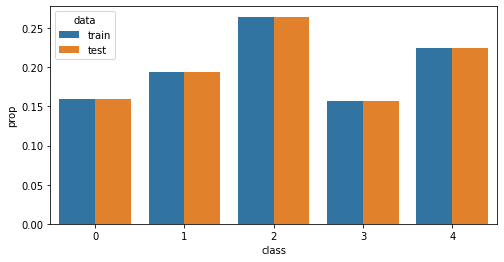

In [23]:
y_counts = pd.DataFrame({
    'data': np.array(['train'] * num_classes + ['test'] * num_classes),
    'class': np.tile(np.arange(num_classes), 2),
    'prop': np.hstack([np.bincount(train_label['RaceId']) / train_label.shape[0],
                         np.bincount(test_label['RaceId']) / test_label.shape[0]])
})

fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(x='class', y='prop', hue='data', data=y_counts, ax=ax)

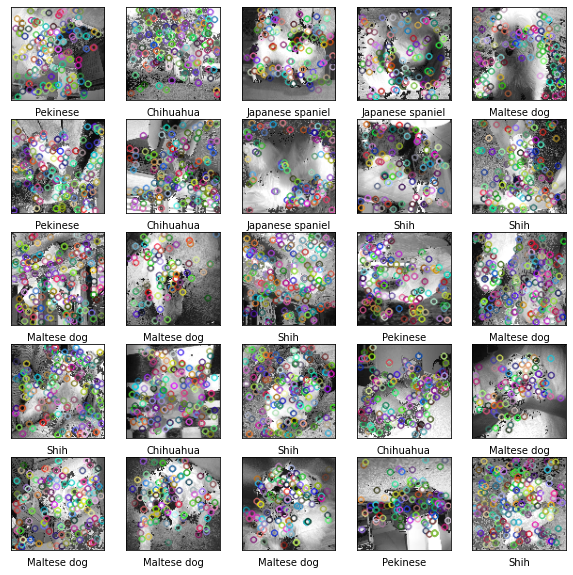

In [24]:
plt.figure(figsize=(10,10))
k=0
for i in train_image.index[:25]:
    plt.subplot(5,5,k+1)
    k+=1
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_image['Image'][i])
    plt.xlabel(train_label['Race'][i])
plt.show()

We normalize the data:

In [25]:
train_images = train_image['Image']
test_images = test_image['Image']

train_labels=train_label['RaceId']
test_labels=test_label['RaceId']

input_shape = (dim,dim,3)

The scale of grey is now from 0 to 1.

In [26]:
train_labels.shape

(13708,)

In [27]:
test_labels.shape

(1524,)

###**Creation of a validation set**

We further split the train set into a train and validation set. The validation set will be 20% from the original train set, therefore the split will be train/validation of 0.8/0.2.

The actual training set will be divided into two groups:
* the training set
* the validation set

In [28]:

train_images, valid_images, train_labels, valid_labels = train_test_split(train_images, train_labels, test_size=0.2, random_state=2020)

In [29]:
train_id=train_images.index
valid_id=valid_images.index
test_id=test_images.index

In [30]:
partition = {'train' : [str(i) for i in train_id], 'validation' : [str(i) for i in valid_id]}

labels={}
for i in train_id:
    labels[str(i)]=train_labels[i]
for i in valid_id:
    labels[str(i)]=valid_labels[i]


### We define a class used not to overflow our GPU.

In [31]:
batch_size=32
epochs=40

In [32]:
import keras

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=batch_size, dim=input_shape, n_classes=num_classes, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim)
        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        y = np.empty((self.batch_size), dtype=int)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = data['Image'][int(ID)]

            # Store class
            y[i] = self.labels[ID]

        return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

In [33]:
train_images=np.asarray([i.astype(np.float32) for i in train_images])

valid_images=np.asarray([i.astype(np.float32) for i in valid_images])

test_images=np.asarray([i.astype(np.float32) for i in test_images])

In [34]:
test_labels = to_categorical(test_labels, num_classes)
test_labels=np.asarray([i.astype(np.float32) for i in test_labels])

In [35]:
#Generators

training_generator = DataGenerator(partition['train'], labels)
validation_generator = DataGenerator(partition['validation'], labels)

es = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

# Création du premier CNN

In [36]:
batch_size = 32
epochs = 40

In [37]:

input_shape = train_images.shape[1:]


model_cnn = Sequential()
model_cnn.add(Conv2D(16, kernel_size=5, activation='relu', input_shape=input_shape, name='conv2d_1'))
model_cnn.add(Conv2D(32, kernel_size=4, activation='relu', name='conv2d_2'))
model_cnn.add(MaxPooling2D(pool_size=2, name='max_pool_1'))
model_cnn.add(Flatten(name='flatten'))
model_cnn.add(Dense(50, activation='relu', name='dense'))
model_cnn.add(Dense(num_classes, activation='softmax', name='output'))

model_cnn.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

model_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 96, 96, 16)        1216      
                                                                 
 conv2d_2 (Conv2D)           (None, 93, 93, 32)        8224      
                                                                 
 max_pool_1 (MaxPooling2D)   (None, 46, 46, 32)        0         
                                                                 
 dropout_1 (Dropout)         (None, 46, 46, 32)        0         
                                                                 
 flatten (Flatten)           (None, 67712)             0         
                                                                 
 dense (Dense)               (None, 50)                3385650   
                                                                 
 output (Dense)              (None, 5)                 2

In [38]:

# Run the train
time0=time.time()
history_cnn = model_cnn.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator)


score_cnn = model_cnn.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_cnn[0])
print('Test accuracy:', score_cnn[1])
time1=time.time()-time0

Epoch 1/40
342/342 [==============================] - 10s 10ms/step - loss: 18.1207 - accuracy: 0.2622 - val_loss: 1.5968 - val_accuracy: 0.2662

# Fine-tuning du CNN

### **Second version of the CNN: changing the kernel size**

In [39]:
time0=time.time()
model_cnn2 = Sequential()
model_cnn2.add(Conv2D(16, kernel_size=10, activation='relu', input_shape=input_shape, name='conv2d_1'))
model_cnn2.add(Conv2D(32, kernel_size=8, activation='relu', name='conv2d_2'))
model_cnn2.add(MaxPooling2D(pool_size=2, name='max_pool_1'))
model_cnn2.add(Flatten(name='flatten'))
model_cnn2.add(Dense(50, activation='relu', name='dense'))
model_cnn2.add(Dense(num_classes, activation='softmax', name='output'))

model_cnn2.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

model_cnn2.summary()




Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 91, 91, 16)        4816      
                                                                 
 conv2d_2 (Conv2D)           (None, 84, 84, 32)        32800     
                                                                 
 max_pool_1 (MaxPooling2D)   (None, 42, 42, 32)        0         
                                                                 
 dropout_1 (Dropout)         (None, 42, 42, 32)        0         
                                                                 
 flatten (Flatten)           (None, 56448)             0         
                                                                 
 dense (Dense)               (None, 50)                2822450   
                                                                 
 output (Dense)              (None, 5)                

In [40]:

# Run the train
history_cnn2 = model_cnn2.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator)
score_cnn2 = model_cnn2.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_cnn2[0])
print('Test accuracy:', score_cnn2[1])
time1=time.time()-time0


Epoch 1/40
342/342 [==============================] - 4s 10ms/step - loss: 10.6713 - accuracy: 0.2855 - val_loss: 1.5373 - val_accuracy: 0.3287



---



### **3rd version of the CNN: Changing the optimizer and adding rescaling**

Instead of using Adadelta optimizer, we are trying to assess if other optimizers would build better predictive model. We are now using the 'Adam' optimizer.

In [41]:
time0=time.time()
model_cnn3 = Sequential()
model_cnn3.add(Rescaling(1./255, input_shape=input_shape))
model_cnn3.add(Conv2D(16, kernel_size=10, activation='relu', input_shape=input_shape, name='conv2d_1'))
model_cnn3.add(Conv2D(32, kernel_size=8, activation='relu', name='conv2d_2'))
model_cnn3.add(MaxPooling2D(pool_size=2, name='max_pool_1'))
model_cnn3.add(Flatten(name='flatten'))
model_cnn3.add(Dense(50, activation='relu', name='dense'))
model_cnn3.add(Dense(num_classes, activation='softmax', name='output'))

model_cnn3.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)



In [42]:

# Run the train
history_cnn3 = model_cnn3.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator)
score_cnn3 = model_cnn3.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_cnn3[0])
print('Test accuracy:', score_cnn3[1])
time1=time.time()-time0

Epoch 1/40
342/342 [==============================] - 4s 10ms/step - loss: 1.5974 - accuracy: 0.2675 - val_loss: 1.5816 - val_accuracy: 0.2849

Adam optimizer increased the accuracy level on the test set.

### **4th version of the CNN: Preventing overfitting and adding layers**

In [43]:
time0=time.time()
model_cnn4 = Sequential()
model_cnn4.add(Rescaling(1./255, input_shape=input_shape))
model_cnn4.add(Conv2D(16, kernel_size=10, activation='relu', input_shape=input_shape, name='conv2d_1'))
model_cnn4.add(MaxPooling2D(pool_size=3, name='max_pool_1'))
model_cnn4.add(Conv2D(32, kernel_size=8, activation='relu', name='conv2d_2'))
model_cnn4.add(MaxPooling2D(pool_size=2, name='max_pool_2'))
model_cnn4.add(Conv2D(32, kernel_size=6, activation='relu', name='conv2d_3'))
model_cnn4.add(MaxPooling2D(pool_size=2, name='max_pool_3'))
model_cnn4.add(Flatten(name='flatten'))
model_cnn4.add(Dense(50, activation='relu', name='dense'))
model_cnn4.add(Dense(num_classes, activation='softmax', name='output'))

model_cnn4.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

In [44]:
# Run the train
history_cnn4 = model_cnn4.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/40
342/342 [==============================] - 3s 8ms/step - loss: 1.5814 - accuracy: 0.2729 - val_loss: 1.5638 - val_accuracy: 0.2879

In [45]:
score_cnn4 = model_cnn4.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_cnn4[0])
print('Test accuracy:', score_cnn4[1])
time1=time.time()-time0

Test loss: 0.41496792435646057
Test accuracy: 0.8615485429763794


### **5th version of the CNN: Fine-tuning and trials**

In [46]:

time0=time.time()
model_cnn5 = Sequential()
model_cnn5.add(Rescaling(1./255, input_shape=input_shape))
model_cnn5.add(LayerNormalization())
model_cnn5.add(Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=input_shape))
model_cnn5.add(Conv2D(32, kernel_size=(3,3), activation='relu'))
model_cnn5.add(MaxPooling2D(pool_size=(3,3)))

model_cnn5.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model_cnn5.add(MaxPooling2D(pool_size=(3,3)))

model_cnn5.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model_cnn5.add(MaxPooling2D(pool_size=(3,3)))



model_cnn5.add(Flatten())
model_cnn5.add(Dense(num_classes*10, activation='relu'))
model_cnn5.add(Dropout(0.1))
model_cnn5.add(Dense(num_classes, activation='softmax'))

model_cnn5.compile(
   optimizer='adam',
   loss='categorical_crossentropy',
   metrics=['accuracy'],
)


model_cnn5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 100, 100, 3)       0         
                                                                 
 layer_normalization (LayerN  (None, 100, 100, 3)      6         
 ormalization)                                                   
                                                                 
 conv2d (Conv2D)             (None, 98, 98, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 96, 96, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 32, 32, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 30, 30, 64)       

In [47]:
# Run the train
history_cnn5 = model_cnn5.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/40
342/342 [==============================] - 6s 16ms/step - loss: 1.5774 - accuracy: 0.2751 - val_loss: 1.5393 - val_accuracy: 0.3085

In [48]:
score_cnn5 = model_cnn5.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_cnn5[0])
print('Test accuracy:', score_cnn5[1])
time1=time.time()-time0


Test loss: 0.15893761813640594
Test accuracy: 0.9776902794837952


In [49]:
model_cnn5.save('saved_model/model5.h5')

# Re-training du VGG16

In [50]:
from keras.applications import VGG16

## Loading VGG16 model
base_model = VGG16(weights="imagenet", include_top=False, input_shape=input_shape)
base_model.trainable = False ## Not trainable weights


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(num_classes*10, activation='relu')
dense_layer_2 = layers.Dense(num_classes*5, activation='relu')
dropout_layer = layers.Dropout(0.1)
prediction_layer = layers.Dense(num_classes, activation='softmax')


model_vgg = Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

model_vgg.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

history_model_vgg=model_vgg.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/40
342/342 [==============================] - 8s 22ms/step - loss: 1.7221 - accuracy: 0.3523 - val_loss: 1.3091 - val_accuracy: 0.4180

In [51]:
score_model_vgg = model_vgg.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_model_vgg[0])
print('Test accuracy:', score_model_vgg[1])

Test loss: 0.19476212561130524
Test accuracy: 0.9645669460296631


# Re-training du ResNet50

In [75]:
from keras.applications import ResNet50

base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)
base_model.trainable = False ## Not trainable weights


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(num_classes*10, activation='relu')
dense_layer_2 = layers.Dense(num_classes*5, activation='relu')
dropout_layer = layers.Dropout(0.05)
prediction_layer = layers.Dense(num_classes, activation='softmax')


model_res = Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

model_res.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

history_model_res=model_res.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/40
342/342 [==============================] - 11s 24ms/step - loss: 1.3621 - accuracy: 0.5163 - val_loss: 0.8486 - val_accuracy: 0.6577

In [76]:
score_model_res = model_res.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_model_res[0])
print('Test accuracy:', score_model_res[1])

Test loss: 0.07341604679822922
Test accuracy: 0.9822834730148315


# Re-training du InceptionResnetV2

In [54]:
from keras.applications import InceptionResNetV2

base_model = InceptionResNetV2(weights="imagenet", include_top=False, input_shape=input_shape)
base_model.trainable = False ## Not trainable weights


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(num_classes*10, activation='relu')
dense_layer_2 = layers.Dense(num_classes*5, activation='relu')
dropout_layer = layers.Dropout(0.1)
prediction_layer = layers.Dense(num_classes, activation='softmax')


model_inc = Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

model_inc.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

history_model_inc=model_inc.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/40
342/342 [==============================] - 25s 49ms/step - loss: 10.5781 - accuracy: 0.1916 - val_loss: 1.6085 - val_accuracy: 0.2658

In [55]:
score_model_inc = model_inc.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', score_model_inc[0])
print('Test accuracy:', score_model_inc[1])

Test loss: 1.598704218864441
Test accuracy: 0.26443570852279663


# Comparaison entre notre modèle "Fait-main" et VGG16



### Comparaison of accuracy and loss

In [56]:
# summarize history for accuracy

def history_accuracy(history_model):
  history = history_model
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()
# summarize history for loss

def history_loss(history_model):
  history = history_model
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()



4TH CNN MODEL: 


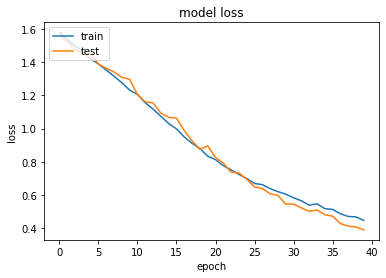

5th CNN MODEL:


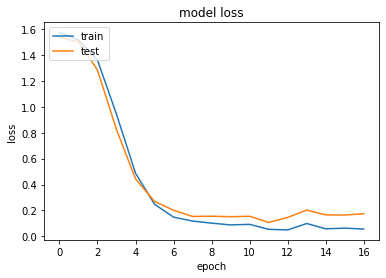

VGG16 MODEL: 


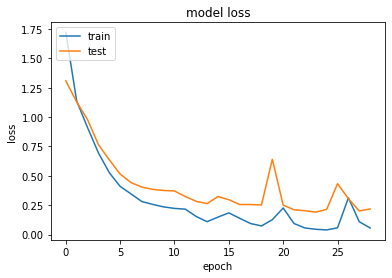

ResNet50 MODEL: 


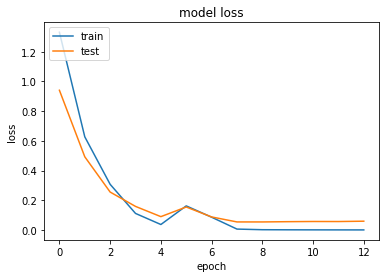

In [57]:
#Loss

print("4TH CNN MODEL: ")
history_loss(history_cnn4)
print("5th CNN MODEL:")
history_loss(history_cnn5)
print("VGG16 MODEL: ")
history_loss(history_model_vgg)
print("ResNet50 MODEL: ")
history_loss(history_model_res)

4TH CNN MODEL: 


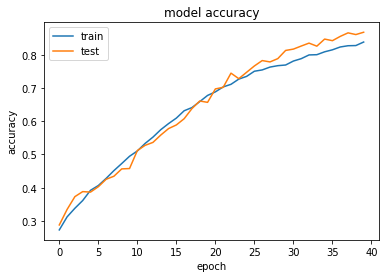

5TH CNN MODEL: 


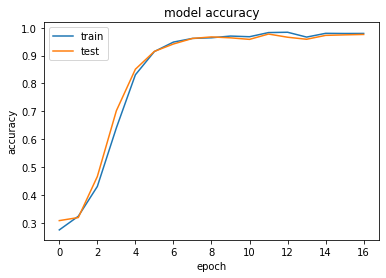

VGG16 MODEL: 


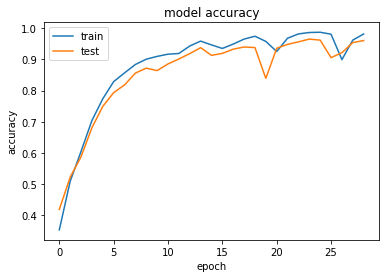

ResNet50 MODEL: 


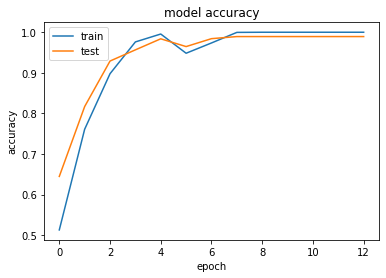

In [58]:
# Accuracy
print("4TH CNN MODEL: ")
history_accuracy(history_cnn4)
print("5TH CNN MODEL: ")
history_accuracy(history_cnn5)
print("VGG16 MODEL: ")
history_accuracy(history_model_vgg)
print("ResNet50 MODEL: ")
history_accuracy(history_model_res)


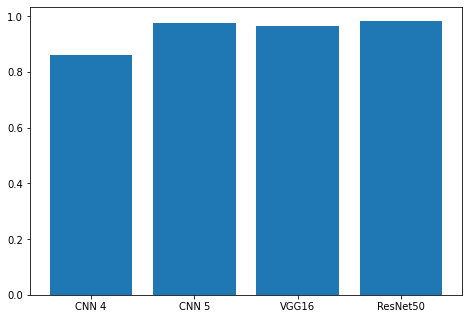

In [59]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
CNN = ['CNN 4','CNN 5', 'VGG16', 'ResNet50']
Test_Accuracy = [score_cnn4[1],score_cnn5[1],score_model_vgg[1],score_model_res[1]]
ax.bar(CNN,Test_Accuracy)
plt.show()

### II. B. Which dogs are the harder to classify ?

In [60]:
def plot_value_array(i, predictions_array, true_label):
    true_label_temp = true_label[i]
    plt.grid(False)
    plt.xticks(range(num_classes))
    plt.yticks([])
    thisplot = plt.bar(range(num_classes), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)
    true_label2=np.argmax(true_label_temp)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label2].set_color('blue')

In [61]:
# Plot the first X test images, their predicted labels, and the true labels.
# Color correct predictions in blue and incorrect predictions in red.
def plot_prediction_images(prediction):
    num_rows = 6
    num_cols = 8
    num_images = num_rows*num_cols
    plt.figure(figsize=(2*2*num_cols, 2*num_rows))
    for i in range (num_images):
        plt.subplot(num_rows, 2*num_cols, i+1)
        plot_value_array(i, prediction[i], test_labels)
    plt.tight_layout()
    plt.show()



In [62]:
import tensorflow


### 4th CNN predictions

48/48 [==============================] - 0s 2ms/step


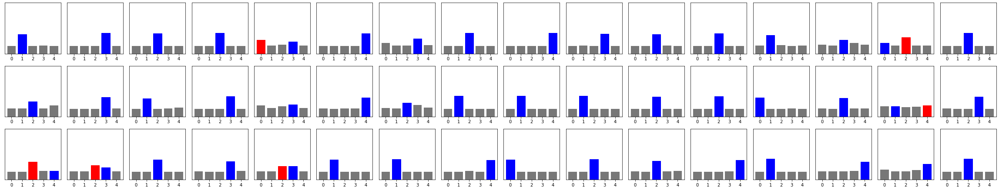

In [63]:
probability_model4 = tensorflow.keras.Sequential([model_cnn4,
                                         tensorflow.keras.layers.Softmax()])
predictions4 = probability_model4.predict(test_images)
plot_prediction_images(predictions4)

### 5th CNN predictions

48/48 [==============================] - 1s 10ms/step


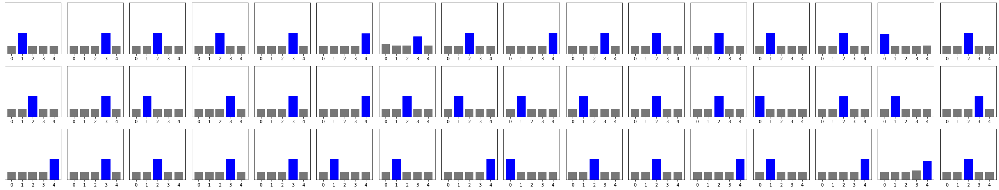

In [64]:
probability_model5 = tensorflow.keras.Sequential([model_cnn5,
                                         tensorflow.keras.layers.Softmax()])
predictions5 = probability_model5.predict(test_images)
plot_prediction_images(predictions5)

### VGG16 predictions

48/48 [==============================] - 1s 16ms/step


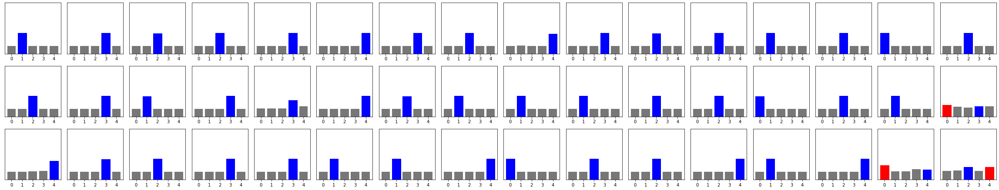

In [65]:
probability_model = tensorflow.keras.Sequential([model_vgg,
                                         tensorflow.keras.layers.Softmax()])
predictions_vgg = probability_model.predict(test_images)
plot_prediction_images(predictions_vgg)

### ResNet50 predictions

48/48 [==============================] - 2s 14ms/step


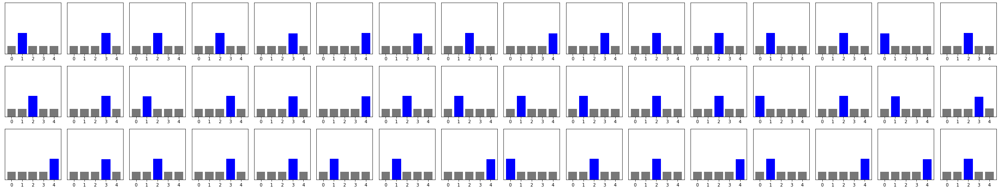

In [66]:
probability_model = tensorflow.keras.Sequential([model_res,
                                         tensorflow.keras.layers.Softmax()])
predictions_vgg = probability_model.predict(test_images)
plot_prediction_images(predictions_vgg)

In [67]:
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion matrix', cmap=plt.cm.Blues):
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=90)
  plt.yticks(tick_marks, classes)

  if normalize:  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [68]:
from sklearn.metrics import confusion_matrix, classification_report
import itertools

48/48 [==============================] - 0s 4ms/step


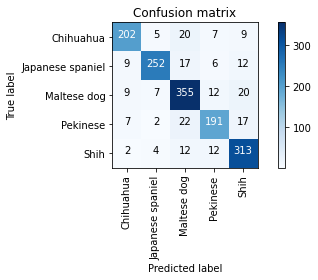

In [69]:
# Predict the values from the validation dataset
Y_pred = model_cnn4.predict(test_images)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(test_labels,axis = 1)
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = class_names)


48/48 [==============================] - 1s 12ms/step


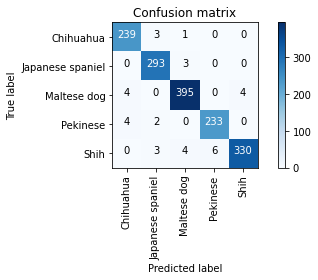

In [70]:
# Predict the values from the validation dataset
Y_pred = model_cnn5.predict(test_images)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(test_labels,axis = 1)
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = class_names)

# **Extending the models to the whole DataFrame**


In [77]:
num_classes=120

In [78]:
data=pd.DataFrame(columns=['Image','Race','RaceId'],dtype=np.float32)

In [79]:
i=0
for Folder in Folders[:num_classes]:
    tempdata=Extract_Images(Folder)
    data=pd.concat([data,pd.concat([tempdata,pd.DataFrame([i]*(tempdata.shape[0]),columns=['RaceId'])],axis=1)])
    if i%20==0:
        print(i)
    i+=1

0
20
40
60
80
100


In [80]:
data.reset_index(inplace=True)
print(data.shape)

(82320, 4)


In [81]:
class_names=pd.unique(data['Race'])

In [82]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))

In [83]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))

In [84]:
data_original=data.copy()

In [85]:
for k in range(data['Image'].shape[0]):
    gray=data['Grayscale'][k]
    img=data['Image'][k]
    dst = cv.cornerHarris(gray,2,3,0.04)
    img[dst>0.005*dst.max()]=[255,0,0]
    if k%10000==0:
        print(k)

0
10000
20000
30000
40000
50000
60000
70000
80000


In [86]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))

In [87]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))

In [88]:
data=pd.concat([data,data_original],axis=0)
data_original=data.copy()

In [89]:
data.reset_index(inplace=True)

print(data.shape)

(164640, 6)


In [90]:
for k in range(data['Image'].shape[0]):
    gray=data['Grayscale'][k]
    img=data['Image'][k]
    sift = cv.xfeatures2d.SIFT_create()
    kp = sift.detect(img, None)
    img=cv.drawKeypoints(gray,kp,img)
    if k%10000==0:
        print(k)

0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000


In [91]:
data['Grayscale']=data['Image'].apply(lambda x : cv.cvtColor(x,cv.COLOR_BGR2GRAY))

In [92]:
data['Grayscale']=data['Grayscale'].apply(lambda x : cv.convertScaleAbs(cv.equalizeHist(x),alpha=1,beta=10))

In [93]:
data=pd.concat([data,data_original],axis=0)
data=data.drop(['level_0','index'],axis=1)
data.reset_index(inplace=True)
print(data.shape)

(329280, 5)


## Pre processing of the data


In [94]:
train_image,test_image,train_label, test_label = train_test_split(data.loc[:,['Image','Grayscale']],data.loc[:,['Race','RaceId']],stratify=data['RaceId'],test_size=0.1)

<AxesSubplot:xlabel='class', ylabel='prop'>

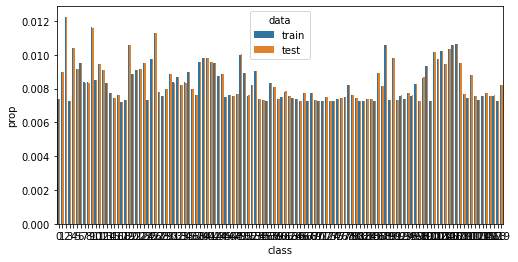

In [95]:
y_counts = pd.DataFrame({
    'data': np.array(['train'] * num_classes + ['test'] * num_classes),
    'class': np.tile(np.arange(num_classes), 2),
    'prop': np.hstack([np.bincount(train_label['RaceId']) / train_label.shape[0],
                         np.bincount(test_label['RaceId']) / test_label.shape[0]])
})

fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(x='class', y='prop', hue='data', data=y_counts, ax=ax)

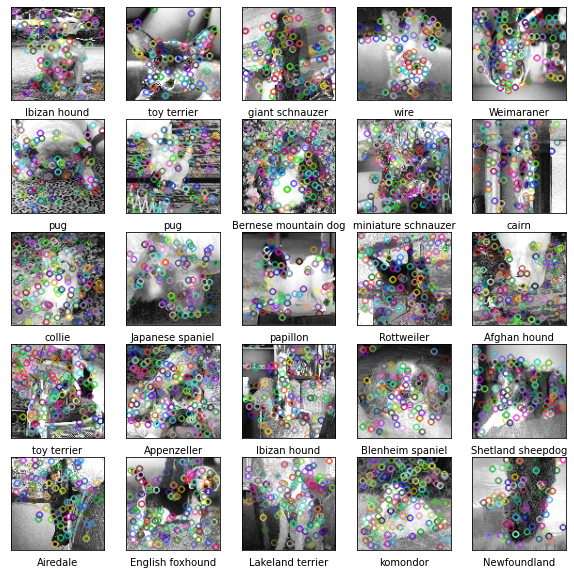

In [96]:
plt.figure(figsize=(10,10))
k=0
for i in train_image.index[:25]:
    plt.subplot(5,5,k+1)
    k+=1
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_image['Image'][i])
    plt.xlabel(train_label['Race'][i])
plt.show()

We normalize the data:

In [97]:
train_images = train_image['Image']
test_images = test_image['Image']

train_labels=train_label['RaceId']
test_labels=test_label['RaceId']

The scale of grey is now from 0 to 1.

In [98]:
train_labels.shape

(296352,)

In [99]:
test_labels.shape

(32928,)

###**Creation of a validation set**

We further split the train set into a train and validation set. The validation set will be 20% from the original train set, therefore the split will be train/validation of 0.8/0.2.

The actual training set will be divided into two groups:
* the training set
* the validation set

In [100]:

train_images, valid_images, train_labels, valid_labels = train_test_split(train_images, train_labels, test_size=0.2, random_state=2020)

In [101]:
train_id=train_images.index
valid_id=valid_images.index
test_id=test_images.index

In [102]:
partition = {'train' : [str(i) for i in train_id], 'validation' : [str(i) for i in valid_id]}

labels={}
for i in train_id:
    labels[str(i)]=train_labels[i]
for i in valid_id:
    labels[str(i)]=valid_labels[i]


### We define a class used not to overflow our GPU.

In [103]:
batch_size=256
epochs=200
input_shape=(dim,dim,3)

In [104]:
import keras

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, labels, batch_size=batch_size, dim=input_shape, n_classes=num_classes, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim)
        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        y = np.empty((self.batch_size), dtype=int)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = data['Image'][int(ID)]

            # Store class
            y[i] = self.labels[ID]

        return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

In [105]:

test_images=np.asarray([i.astype(np.float32) for i in test_images])


In [106]:
test_labels = to_categorical(test_labels, num_classes)
test_labels=np.asarray([i.astype(np.float32) for i in test_labels])


In [107]:
def create_neural_network(MaxPoolNum=3,PoolSizeList=[(3,3),(3,3),(2,2)],ConvList=[2,2,3],KerSizes=[[(3,3),(3,3)],[(3,3),(3,3)],[(3,3),(3,3),(3,3)]],ConvArgList=[[32,32],[64,64],[128,128,256]],optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'],rescaling=True,input_shape=input_shape,dropout_rate=0.75,normalization=False):
    model_temp = Sequential()
    if rescaling:
        model_temp.add(Rescaling(1./255, input_shape=input_shape))
    for k in range(MaxPoolNum):
        for i in range(ConvList[k]):
            if k==0 and i==0:
                model_temp.add(Conv2D(ConvArgList[k][i],kernel_size=KerSizes[k][i],activation='relu', input_shape=input_shape))
            else:
                model_temp.add(Conv2D(ConvArgList[k][i],kernel_size=KerSizes[k][i],activation='relu'))
        if k==0 and normalization==True:
            model_temp.add(LayerNormalization())
        model_temp.add(MaxPooling2D(pool_size=PoolSizeList[k]))


    model_temp.add(Flatten())
    model_temp.add(Dense(num_classes*5, activation='relu'))
    model_temp.add(Dropout(dropout_rate))
    model_temp.add(Dense(num_classes, activation='softmax'))

    model_temp.compile(optimizer=optimizer,loss=loss,metrics=metrics)
    return model_temp


In [108]:
#Generators

training_generator = DataGenerator(partition['train'], labels)
validation_generator = DataGenerator(partition['validation'], labels)

es = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

### Run the models

First model

In [109]:
time0=time.time()
wholemodel_cnn = create_neural_network(MaxPoolNum=3,PoolSizeList=[3,2,2],ConvList=[1,1,1],
                                        KerSizes=[[10],[8],[6]],ConvArgList=[[16],[32],[32]],
                                        optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'],
                                        rescaling=True,input_shape=input_shape,dropout_rate=0,normalization=True)

wholemodel_cnn.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 100, 100, 3)       0         
                                                                 
 conv2d_207 (Conv2D)         (None, 91, 91, 16)        4816      
                                                                 
 layer_normalization_1 (Laye  (None, 91, 91, 16)       32        
 rNormalization)                                                 
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 30, 30, 16)       0         
 2D)                                                             
                                                                 
 conv2d_208 (Conv2D)         (None, 23, 23, 32)        32800     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 11, 11, 32)     

In [ ]:
# Run the train
wholehistory_cnn = wholemodel_cnn.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/200
926/926 [==============================] - 117s 125ms/step - loss: 4.6294 - accuracy: 0.0266 - val_loss: 4.5075 - val_accuracy: 0.0396

In [ ]:
wholescore_cnn = wholemodel_cnn.evaluate(test_images, test_labels, verbose=0)
print('Test loss:', wholescore_cnn[0])
print('Test accuracy:', wholescore_cnn[1])
time1=time.time()-time0

Second model

In [109]:
time0=time.time()
wholemodel_cnn2 = create_neural_network(MaxPoolNum=3,PoolSizeList=[(3,3),(3,3),(3,3)],ConvList=[2,2,1],
                                        KerSizes=[[(3,3),(3,3)],[(4,4),(3,3)],[(3,3)]],ConvArgList=[[16,16],[64,64],[256]],
                                        optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'],
                                        rescaling=True,input_shape=input_shape,dropout_rate=0,normalization=True)

checkpoint=tf.keras.callbacks.ModelCheckpoint(filepath="Checkpoints/cp.ckpt",
                                                 save_weights_only=True,
                                                 verbose=1)
wholemodel_cnn2.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 100, 100, 3)       0         
                                                                 
 conv2d_210 (Conv2D)         (None, 98, 98, 16)        448       
                                                                 
 conv2d_211 (Conv2D)         (None, 96, 96, 16)        2320      
                                                                 
 layer_normalization_2 (Laye  (None, 96, 96, 16)       32        
 rNormalization)                                                 
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 32, 32, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_212 (Conv2D)         (None, 29, 29, 64)      

In [110]:
# Run the train
wholehistory_cnn2 = wholemodel_cnn2.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es,checkpoint])

Epoch 1/200
926/926 [==============================] - ETA: 0s - loss: 4.5354 - accuracy: 0.0371   

In [111]:
wholescore_cnn2 = wholemodel_cnn2.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:', wholescore_cnn2[0])
print('Test accuracy:', wholescore_cnn2[1])
time1=time.time()-time0

Test loss: 0.7688756585121155
Test accuracy: 0.8740000128746033


In [112]:
wholemodel_cnn2.save("saved_model/wholemodel.h5")

In [113]:
from keras.saving.save import load_model

loaded_model=load_model('C:/Users/antoi/Dropbox/PC/Documents/GitHub/Projet-6/saved_model/wholemodel.h5')
testload=loaded_model.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:',testload[0])
print('Test accuracy:', testload[1])

Test loss: 0.7688756585121155
Test accuracy: 0.8740000128746033


In [114]:
np.save('class_names.npy',class_names,allow_pickle=True)

# Re-training du VGG16

In [ ]:
from keras.applications import VGG16

## Loading VGG16 model
base_model = VGG16(weights="imagenet", include_top=False, input_shape=input_shape)
base_model.trainable = False ## Not trainable weights


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(num_classes*10, activation='relu')
dense_layer_2 = layers.Dense(num_classes*5, activation='relu')
dropout_layer = layers.Dropout(0.1)
prediction_layer = layers.Dense(num_classes, activation='softmax')


wholemodel_vgg = Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

wholemodel_vgg.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

history_wholemodel_vgg=wholemodel_vgg.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/200
926/926 [==============================] - 116s 125ms/step - loss: 4.7540 - accuracy: 0.0543 - val_loss: 4.0764 - val_accuracy: 0.0996

In [ ]:
score_wholemodel_vgg = wholemodel_vgg.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:', score_wholemodel_vgg[0])
print('Test accuracy:', score_wholemodel_vgg[1])

In [ ]:
wholemodel_vgg.save("saved_model/wholemodelvgg.h5")

In [1]:
from keras.saving.save import load_model

loaded_modelvgg=load_model('C:/Users/antoi/Dropbox/PC/Documents/GitHub/Projet-6/saved_model/saved_model/wholemodelvgg.h5')
testload=loaded_modelvgg.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:',testload[0])
print('Test accuracy:', testload[1])

NameError: name 'test_images' is not defined

# Re-training du ResNet50

In [117]:
from keras.applications import ResNet50

## Loading ResNet50 model
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)
base_model.trainable = False ## Not trainable weights


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(num_classes*10, activation='relu')
dense_layer_2 = layers.Dense(num_classes*5, activation='relu')
dropout_layer = layers.Dropout(0.1)
prediction_layer = layers.Dense(num_classes, activation='softmax')


wholemodel_res = Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

wholemodel_res.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'],
)

history_wholemodel_res=wholemodel_res.fit(training_generator,
                            batch_size=batch_size,
                            epochs=epochs,
                            verbose=1,
                            validation_data=validation_generator,
                            callbacks=[es])

Epoch 1/200
926/926 [==============================] - 104s 109ms/step - loss: 4.5436 - accuracy: 0.0813 - val_loss: 3.7548 - val_accuracy: 0.1567

In [120]:
score_wholemodel_res = wholemodel_res.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:', score_wholemodel_res[0])
print('Test accuracy:', score_wholemodel_res[1])

Test loss: 0.4731587767601013
Test accuracy: 0.921625018119812


In [121]:
wholemodel_res.save("saved_model/wholemodelres.h5")

INFO:tensorflow:Assets written to: saved_model/wholemodelres\assets


INFO:tensorflow:Assets written to: saved_model/wholemodelres\assets


In [ ]:
from keras.saving.save import load_model

loaded_modelres=load_model('C:/Users/antoi/Dropbox/PC/Documents/GitHub/Projet-6/saved_model/saved_model/wholemodelres.h5')
testload=loaded_modelres.evaluate(test_images[:16000], test_labels[:16000], verbose=0)
print('Test loss:',testload[0])
print('Test accuracy:', testload[1])

# Comparaison entre notre modèle "Fait-main", VGG16 et ResNet50



### Comparaison of accuracy and loss

In [ ]:
# summarize history for accuracy

def history_accuracy(history_model):
  history = history_model
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()
# summarize history for loss

def history_loss(history_model):
  history = history_model
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()



In [ ]:
#Loss
print("1st CNN MODEL: ")
history_loss(wholehistory_cnn)
print("2nd CNN MODEL:")
history_loss(wholehistory_cnn2)
print("VGG16 MODEL: ")
history_loss(history_wholemodel_vgg)
print("ResNet50 MODEL: ")
history_loss(history_wholemodel_res)


In [ ]:
# Accuracy
print("1st CNN MODEL: ")
history_accuracy(wholehistory_cnn)
print("2nd CNN MODEL:")
history_accuracy(wholehistory_cnn2)
print("VGG16 MODEL: ")
history_accuracy(history_wholemodel_vgg)
print("ResNet50 MODEL: ")
history_accuracy(history_wholemodel_res)



In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
CNN = ['CNN 2', 'VGG16', 'ResNet50']
Test_Accuracy = [wholescore_cnn2[1],score_wholemodel_vgg[1],score_wholemodel_res[1]]
ax.bar(CNN,Test_Accuracy)
plt.show()

### II. B. Which dogs are the harder to classify ?

In [ ]:
def plot_value_array(i, predictions_array, true_label):
    true_label_temp = true_label[i]
    plt.grid(False)
    plt.xticks(range(num_classes))
    plt.yticks([])
    thisplot = plt.bar(range(num_classes), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)
    true_label2=np.argmax(true_label_temp)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label2].set_color('blue')

In [ ]:
# Plot the first X test images, their predicted labels, and the true labels.
# Color correct predictions in blue and incorrect predictions in red.
def plot_prediction_images(prediction):
    num_rows = 6
    num_cols = 8
    num_images = num_rows*num_cols
    plt.figure(figsize=(2*2*num_cols, 2*num_rows))
    for i in range (num_images):
        plt.subplot(num_rows, 2*num_cols, i+1)
        plot_value_array(i, prediction[i], test_labels)
    plt.tight_layout()
    plt.show()

In [ ]:
import tensorflow


### 4th CNN predictions

In [ ]:
probability_model4 = tensorflow.keras.Sequential([wholemodel_cnn,
                                         tensorflow.keras.layers.Softmax()])
predictions4 = probability_model4.predict(test_images)
plot_prediction_images(predictions4)

### 5th CNN predictions

In [ ]:
probability_model5 = tensorflow.keras.Sequential([wholemodel_cnn2,
                                         tensorflow.keras.layers.Softmax()])
predictions5 = probability_model5.predict(test_images)
plot_prediction_images(predictions5)

### VGG16 predictions

In [ ]:
probability_model = tensorflow.keras.Sequential([wholemodel_vgg,
                                         tensorflow.keras.layers.Softmax()])
predictions_vgg = probability_model.predict(test_images)
plot_prediction_images(predictions_vgg)

### ResNet50 predictions

In [ ]:
probability_model = tensorflow.keras.Sequential([wholemodel_res,
                                         tensorflow.keras.layers.Softmax()])
predictions_vgg = probability_model.predict(test_images)
plot_prediction_images(predictions_vgg)